In [1]:
import sys

sys.path.append('..')

%load_ext autoreload
%autoreload 2

In [2]:
import utils.coco_generator as coco
import utils.doors_generator as doors
import utils.imagenet_generator as imagenet
import tensorflow as tf
import models

import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import keras.backend as K
import keras
import time
import cv2

from keras.backend.tensorflow_backend import set_session

%matplotlib inline

/scratch/home/aelphy/py27/local/lib/python2.7/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [3]:
BATCH_SIZE = 25

In [4]:
config = tf.ConfigProto()
# config.gpu_options.per_process_gpu_memory_fraction = 0.5

set_session(tf.Session(config=config))

# Build model from scratch

In [5]:
import models.siamese
model = models.siamese.build(
    (256, 256, 3), 1024, 128, 'vgg16'
)

# NOTE: doesn't work with keras
# model.compile(
#     loss=lambda y, x: tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=y, logits=x)),
#     optimizer=keras.optimizers.RMSprop(1e-5),
#     metrics=[]
# )

labels = tf.placeholder(tf.float32, name='labels')

loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=labels, logits=model.output))

global_step = tf.Variable(0, trainable=False)
train_step = tf.train.RMSPropOptimizer(1e-5).minimize(loss, global_step=global_step)
tf.add_to_collection('train_step', train_step)

sess = tf.Session()
sess.run(tf.global_variables_initializer())

input_1 = model.input[0]
input_2 = model.input[1]

# Write graph

In [5]:
graph_writer = tf.summary.FileWriter('../logs/', graph=tf.get_default_graph())
summary_writer = tf.summary.FileWriter('../logs/')
tf.summary.scalar('loss', loss)
merged = tf.summary.merge_all()

# Pretrain model

In [ ]:
# Imagenet
imagenet_headers = imagenet.load_headers_by_categories()
minibatch_generator = imagenet.MinibatchGenerator(imagenet_headers, BATCH_SIZE, 256, 256, positive='class').run()

# Coco
# coco_headers = coco.load_headers_by_categories()
# minibatch_generator = coco.MinibatchGenerator(coco_headers, BATCH_SIZE, 256, 256, positive='class').run()

In [ ]:
#train iter
for i in range(1000000):
    b_l, b_r, b_sim = minibatch_generator.next()

    _, l, summary = sess.run([train_step, loss, merged],
        feed_dict={input_1:b_l*255, input_2:b_r*255, labels: b_sim})
    
    summary_writer.add_summary(summary, i)

    if i % 100 == 0:
        print "\r#%d - Loss"%i, l
        
# for epoch in range(100):
#     x1, x2, y = minibatch_generator.next()
#     loss = model.train_on_batch([x1, x2], y)
#     print(loss)

# Load pretrained weights

In [6]:
with np.load('../weights/siamese_pretrained_imagenet.npz') as f:
    param_values = [f['arr_%d' % i] for i in range(len(f.files))][0]

In [7]:
def reset_model_to_pretrained_state():
    tf.reset_default_graph()
    global model
    global sess
    global train_step
    global loss
    global labels
    
    model = models.siamese.build(
        (256, 256, 3), 1024, 128, 'vgg16'
    )

    labels = tf.placeholder(tf.float32, name='labels')

    loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=labels, logits=model.output))

    global_step = tf.Variable(0, trainable=False)
    train_step = tf.train.RMSPropOptimizer(1e-5).minimize(loss, global_step=global_step)
    tf.add_to_collection('train_step', train_step)

    sess = tf.Session()
    sess.run(tf.global_variables_initializer())
    
    for i, var in enumerate(tf.trainable_variables()):
        sess.run(var.assign(param_values[i]))

In [8]:
def reset_fused_model_to_pretrained_state():
    tf.reset_default_graph()
    global model
    global sess
    global train_step
    global loss
    global labels
    
    model = models.siamese.build(
        (256, 256, 6), 1024, 128, 'vgg16'
    )

    labels = tf.placeholder(tf.float32, name='labels')

    loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=labels, logits=model.output))

    global_step = tf.Variable(0, trainable=False)
    train_step = tf.train.RMSPropOptimizer(1e-5).minimize(loss, global_step=global_step)
    tf.add_to_collection('train_step', train_step)

    sess = tf.Session()
    sess.run(tf.global_variables_initializer())
    
    for i, var in enumerate(tf.trainable_variables()[1:]):
        sess.run(var.assign(param_values[i + 1]))

# Load doors

In [9]:
HAND_CRAFTED_PATH = '/scratch/home/aelphy/projects/guardian/data/doors_from_web/'
HAND_CRAFTED_ANNOTATION_PATH = '/scratch/home/aelphy/projects/guardian/data/hand_crafted_doors.txt'

In [10]:
Xc, Xd, y, wps = doors.load_data()

/scratch/home/aelphy/projects/guardian/data/doors/
/scratch/home/aelphy/projects/guardian/data/doors/20171028/leicawh_patrol_00_wp_01_seq_05_20171028-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171028/leicawh_patrol_00_wp_01_seq_06_20171028-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171028/leicawh_patrol_00_wp_01_seq_07_20171028-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171028/leicawh_patrol_00_wp_01_seq_08_20171028-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171028/leicawh_patrol_00_wp_01_seq_09_20171028-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171028/leicawh_patrol_00_wp_01_seq_10_20171028-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171028/leicawh_patrol_00_wp_01_seq_11_20171028-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171028/leicawh_patrol_00_wp_01_seq_12_20171028-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171028/leicawh_patrol_00_wp_01_seq_13_201

/scratch/home/aelphy/projects/guardian/data/doors/20171028/leicawh_patrol_00_wp_14_seq_11_20171028-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171028/leicawh_patrol_00_wp_14_seq_12_20171028-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171028/leicawh_patrol_00_wp_14_seq_13_20171028-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171028/leicawh_patrol_00_wp_14_seq_14_20171028-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171028/leicawh_patrol_00_wp_14_seq_15_20171028-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171028/leicawh_patrol_00_wp_14_seq_16_20171028-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171028/leicawh_patrol_00_wp_14_seq_17_20171028-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171028/leicawh_patrol_00_wp_16_seq_05_20171028-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171028/leicawh_patrol_00_wp_16_seq_06_20171028-rgb.png
/scratch/home/aelphy/projects/guardia

/scratch/home/aelphy/projects/guardian/data/doors/20171104/leicawh_patrol_00_wp_01_seq_06_20171104-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171104/leicawh_patrol_00_wp_01_seq_07_20171104-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171104/leicawh_patrol_00_wp_01_seq_08_20171104-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171104/leicawh_patrol_00_wp_01_seq_09_20171104-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171104/leicawh_patrol_00_wp_01_seq_10_20171104-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171104/leicawh_patrol_00_wp_01_seq_11_20171104-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171104/leicawh_patrol_00_wp_01_seq_12_20171104-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171104/leicawh_patrol_00_wp_01_seq_13_20171104-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171104/leicawh_patrol_00_wp_01_seq_14_20171104-rgb.png
/scratch/home/aelphy/projects/guardia

/scratch/home/aelphy/projects/guardian/data/doors/20171104/leicawh_patrol_00_wp_12_seq_18_20171104-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171104/leicawh_patrol_00_wp_12_seq_19_20171104-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171104/leicawh_patrol_00_wp_14_seq_05_20171104-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171104/leicawh_patrol_00_wp_14_seq_06_20171104-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171104/leicawh_patrol_00_wp_14_seq_07_20171104-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171104/leicawh_patrol_00_wp_14_seq_08_20171104-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171104/leicawh_patrol_00_wp_14_seq_09_20171104-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171104/leicawh_patrol_00_wp_14_seq_10_20171104-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171104/leicawh_patrol_00_wp_14_seq_11_20171104-rgb.png
/scratch/home/aelphy/projects/guardia

/scratch/home/aelphy/projects/guardian/data/doors/20171103/leicawh_patrol_00_wp_14_seq_01_20171103-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171103/leicawh_patrol_00_wp_14_seq_02_20171103-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171103/leicawh_patrol_00_wp_14_seq_03_20171103-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171103/leicawh_patrol_00_wp_14_seq_04_20171103-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171103/leicawh_patrol_00_wp_16_seq_00_20171103-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171103/leicawh_patrol_00_wp_16_seq_01_20171103-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171103/leicawh_patrol_00_wp_16_seq_02_20171103-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171103/leicawh_patrol_00_wp_16_seq_03_20171103-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171103/leicawh_patrol_00_wp_16_seq_04_20171103-rgb.png
/scratch/home/aelphy/projects/guardia

/scratch/home/aelphy/projects/guardian/data/doors/20171028/leicawh_patrol_00_wp_10_seq_05_20171028-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20171028/leicawh_patrol_00_wp_10_seq_06_20171028-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20171028/leicawh_patrol_00_wp_10_seq_07_20171028-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20171028/leicawh_patrol_00_wp_10_seq_08_20171028-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20171028/leicawh_patrol_00_wp_10_seq_09_20171028-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20171028/leicawh_patrol_00_wp_10_seq_10_20171028-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20171028/leicawh_patrol_00_wp_10_seq_11_20171028-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20171028/leicawh_patrol_00_wp_10_seq_12_20171028-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20171028/leicawh_patrol_00_wp_10_seq_13_201710

/scratch/home/aelphy/projects/guardian/data/doors/20171027/leicawh_patrol_00_wp_11_seq_07_20171027-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20171027/leicawh_patrol_00_wp_11_seq_08_20171027-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20171027/leicawh_patrol_00_wp_12_seq_00_20171027-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20171027/leicawh_patrol_00_wp_12_seq_01_20171027-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20171027/leicawh_patrol_00_wp_12_seq_02_20171027-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20171027/leicawh_patrol_00_wp_12_seq_03_20171027-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20171027/leicawh_patrol_00_wp_12_seq_04_20171027-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20171027/leicawh_patrol_00_wp_12_seq_05_20171027-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20171027/leicawh_patrol_00_wp_12_seq_06_201710

/scratch/home/aelphy/projects/guardian/data/doors/20171104/leicawh_patrol_00_wp_12_seq_10_20171104-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20171104/leicawh_patrol_00_wp_12_seq_11_20171104-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20171104/leicawh_patrol_00_wp_12_seq_12_20171104-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20171104/leicawh_patrol_00_wp_12_seq_13_20171104-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20171104/leicawh_patrol_00_wp_12_seq_14_20171104-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20171104/leicawh_patrol_00_wp_12_seq_15_20171104-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20171104/leicawh_patrol_00_wp_12_seq_16_20171104-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20171104/leicawh_patrol_00_wp_12_seq_17_20171104-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20171104/leicawh_patrol_00_wp_12_seq_18_201711

/scratch/home/aelphy/projects/guardian/data/doors/
/scratch/home/aelphy/projects/guardian/data/doors/20171109/leicawh_patrol_00_wp_01_seq_01_20171109-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171109/leicawh_patrol_00_wp_01_seq_02_20171109-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171109/leicawh_patrol_00_wp_01_seq_03_20171109-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171109/leicawh_patrol_00_wp_02_seq_00_20171109-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171109/leicawh_patrol_00_wp_02_seq_01_20171109-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171109/leicawh_patrol_00_wp_02_seq_02_20171109-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171109/leicawh_patrol_00_wp_03_seq_00_20171109-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171109/leicawh_patrol_00_wp_03_seq_01_20171109-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20171109/leicawh_patrol_00_wp_03_seq_02_201

/scratch/home/aelphy/projects/guardian/data/doors/20170717/leicawh_patrol_00_wp_12_seq_03_20170717-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170717/leicawh_patrol_00_wp_12_seq_04_20170717-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170717/leicawh_patrol_00_wp_12_seq_05_20170717-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_02_seq_00_20170719-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_02_seq_01_20170719-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_02_seq_02_20170719-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_02_seq_03_20170719-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_02_seq_04_20170719-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_02_seq_05_20170719-rgb.png
/scratch/home/aelphy/projects/guardia

/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_12_seq_06_20170719-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_12_seq_07_20170719-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_12_seq_08_20170719-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_12_seq_09_20170719-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_12_seq_10_20170719-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_12_seq_11_20170719-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_12_seq_12_20170719-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_12_seq_13_20170719-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_12_seq_14_20170719-rgb.png
/scratch/home/aelphy/projects/guardia

/scratch/home/aelphy/projects/guardian/data/doors/20170717/leicawh_patrol_00_wp_12_seq_05_20170717-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_02_seq_00_20170719-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_02_seq_01_20170719-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_02_seq_02_20170719-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_02_seq_03_20170719-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_02_seq_04_20170719-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_02_seq_05_20170719-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_02_seq_06_20170719-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_02_seq_07_201707

/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_12_seq_30_20170719-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_12_seq_31_20170719-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_12_seq_32_20170719-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_12_seq_33_20170719-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/
/scratch/home/aelphy/projects/guardian/data/doors/20170703/leicawh_patrol_00_wp_10_seq_00_20170703-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170703/leicawh_patrol_00_wp_10_seq_01_20170703-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170703/leicawh_patrol_00_wp_10_seq_02_20170703-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170703/leicawh_patrol_00_wp_10_seq_03_20170703-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170703/leicawh_pa

/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_10_seq_33_20170719-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_10_seq_34_20170719-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_11_seq_00_20170719-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_11_seq_01_20170719-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_11_seq_02_20170719-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_11_seq_03_20170719-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_11_seq_04_20170719-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_11_seq_05_20170719-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_11_seq_06_20170719-rgb.png
/scratch/home/aelphy/projects/guardia

/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_16_seq_06_20170719-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_16_seq_07_20170719-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_16_seq_08_20170719-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_16_seq_09_20170719-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_16_seq_10_20170719-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_16_seq_11_20170719-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_16_seq_12_20170719-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_16_seq_13_20170719-rgb.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_16_seq_14_20170719-rgb.png
/scratch/home/aelphy/projects/guardia

/scratch/home/aelphy/projects/guardian/data/doors/20170717/leicawh_patrol_00_wp_14_seq_01_20170717-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20170717/leicawh_patrol_00_wp_14_seq_02_20170717-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20170717/leicawh_patrol_00_wp_14_seq_03_20170717-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20170717/leicawh_patrol_00_wp_14_seq_04_20170717-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20170717/leicawh_patrol_00_wp_14_seq_05_20170717-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20170717/leicawh_patrol_00_wp_16_seq_00_20170717-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20170717/leicawh_patrol_00_wp_16_seq_01_20170717-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20170717/leicawh_patrol_00_wp_16_seq_02_20170717-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_10_seq_00_201707

/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_14_seq_29_20170719-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_14_seq_30_20170719-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_14_seq_31_20170719-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_14_seq_32_20170719-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_14_seq_33_20170719-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_14_seq_34_20170719-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_14_seq_35_20170719-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_14_seq_36_20170719-depth_jet.png
/scratch/home/aelphy/projects/guardian/data/doors/20170719/leicawh_patrol_01_wp_16_seq_00_201707

# Annotation

In [11]:
import os
import ipywidgets

In [12]:
# with open(HAND_CRAFTED_ANNOTATION_PATH, 'wb') as f:
#     for fname in os.listdir(HAND_CRAFTED_PATH):
#         im = plt.imread(os.path.join(hand_crafted_path, fname))
#         plt.imshow(im)
#         plt.show()
#         f.write('{}, {}\n'.format(fname, input()))

# Evaluation

In [13]:
sigmoid = lambda x: 1 / (1 + np.exp(-x))

def predict(model, inputs):
    return sigmoid(sess.run(model.output, feed_dict={model.input[0] : inputs[0]*255, model.input[1] : inputs[1]*255}))

def do_test(test_img, label, g):
    tets_metric1 = 0
    for batch in doors.test_iterate_minibatches(test_img, g.closed_reference_doors, BATCH_SIZE):
        tets_metric1 += predict(model, batch).sum()
    mean1 = tets_metric1 / len(g.closed_reference_doors)
    
    tets_metric2 = 0
    for batch in doors.test_iterate_minibatches(test_img, g.open_reference_doors, BATCH_SIZE):
        tets_metric2 += predict(model, batch).sum()
    mean2 = tets_metric2 / len(g.open_reference_doors)
    
    answer = np.argmin([mean1, mean2])
    
    return answer == label, (mean1, mean2), test_img

In [14]:
def do_test2(test_img, label, g):
    tets_metric1 = 0
    for batch in doors.test_iterate_minibatches(test_img, np.vstack([g.closed_reference_doors, g.closed_doors]), BATCH_SIZE):
        tets_metric1 += predict(model, batch).sum()
    mean1 = tets_metric1 / len(g.closed_reference_doors)
    
    tets_metric2 = 0
    for batch in doors.test_iterate_minibatches(test_img, np.vstack([g.open_reference_doors, g.open_doors]), BATCH_SIZE):
        tets_metric2 += predict(model, batch).sum()
    mean2 = tets_metric2 / len(g.open_reference_doors)
    
    answer = np.argmin([mean1, mean2])
    
    return answer == label, (mean1, mean2), test_img

In [15]:
def do_test3(test_img, label, g):
    tets_metric1 = 0
    for batch in doors.test_iterate_minibatches(test_img, g.closed_doors, BATCH_SIZE):
        tets_metric1 += predict(model, batch).sum()
    mean1 = tets_metric1 / len(g.closed_doors)
    
    tets_metric2 = 0
    for batch in doors.test_iterate_minibatches(test_img, g.open_doors, BATCH_SIZE):
        tets_metric2 += predict(model, batch).sum()
    mean2 = tets_metric2 / len(g.open_doors)
    
    answer = np.argmin([mean1, mean2])
    
    return answer == label, (mean1, mean2), test_img

# Handcrafted pares full test

In [18]:
scores = []

for test_wp in set(wps[0]):
    Xc_open = Xc[(y==1) & (wps[0]!=test_wp)]
    Xc_closed = Xc[(y==0) & (wps[0]!=test_wp)]
    
    Xc_open_test = Xc[(y==1) & (wps[0]==test_wp)]
    Xc_closed_test = Xc[(y==0) & (wps[0]==test_wp)]
    
    paired_doors_generator_object = doors.PairMinibatchGenerator(Xc_open, Xc_closed, HAND_CRAFTED_PATH, HAND_CRAFTED_ANNOTATION_PATH, BATCH_SIZE)
    paired_doors_generator = paired_doors_generator_object.run()
    
    reset_model_to_pretrained_state()

    for i in range(500):
        b_l, b_r, b_sim = paired_doors_generator.next()

        _, l = sess.run([train_step, loss],
            feed_dict={model.input[0]: b_l*255, model.input[1]: b_r*255, labels: b_sim})

        if i % 100 == 0:
            print "\r#%d - Loss"%i, l

    for im in Xc_closed_test:
        scores.append(do_test2(im, 0, paired_doors_generator_object))

    for im in Xc_open_test:
        scores.append(do_test2(im, 1, paired_doors_generator_object))

#0 - Loss 0.68346745
#100 - Loss 0.63786227
#200 - Loss 0.37841892
#300 - Loss 0.021777125
#400 - Loss 0.00078621804
#0 - Loss 0.86306745
#100 - Loss 0.7361529
#200 - Loss 0.24721615
#300 - Loss 0.0026169766
#400 - Loss 0.00047044634
#0 - Loss 0.7274125
#100 - Loss 0.6512106
#200 - Loss 0.36976337
#300 - Loss 0.11399752
#400 - Loss 0.004087865
#0 - Loss 0.6731958
#100 - Loss 0.63039196
#200 - Loss 0.20068677
#300 - Loss 0.017654536
#400 - Loss 0.0020277484
#0 - Loss 0.866497
#100 - Loss 0.6414568
#200 - Loss 0.37222123
#300 - Loss 0.007227807
#400 - Loss 0.0005833835
#0 - Loss 0.72134334
#100 - Loss 0.62098664
#200 - Loss 0.35452902
#300 - Loss 0.061458096
#400 - Loss 0.0082005495
#0 - Loss 0.8161793
#100 - Loss 0.65300983
#200 - Loss 0.30308637
#300 - Loss 0.0034633866
#400 - Loss 0.00051038037
#0 - Loss 0.6044211
#100 - Loss 0.66116077
#200 - Loss 0.23338841
#300 - Loss 0.0107692415
#400 - Loss 0.0007871411
#0 - Loss 0.7393913
#100 - Loss 0.6146474
#200 - Loss 0.22225957
#300 - Loss 

# RGB + DEPTH

In [50]:
scores = []

for test_wp in set(wps[0]):
    Xc_open = Xc[(y==1) & (wps[0]!=test_wp)]
    Xc_closed = Xc[(y==0) & (wps[0]!=test_wp)]
    Xd_open = Xd[(y==1) & (wps[0]!=test_wp)]
    Xd_closed = Xd[(y==0) & (wps[0]!=test_wp)]
    
    Xc_open_test = Xc[(y==1) & (wps[0]==test_wp)]
    Xc_closed_test = Xc[(y==0) & (wps[0]==test_wp)]
    Xd_open_test = Xd[(y==1) & (wps[0]==test_wp)]
    Xd_closed_test = Xd[(y==0) & (wps[0]==test_wp)]
    
    paired_doors_generator_object = doors.MinibatchGenerator(np.concatenate([Xc_open, Xd_open], axis=3), np.concatenate([Xc_closed, Xd_closed], axis=3), BATCH_SIZE)
    paired_doors_generator = paired_doors_generator_object.run()
    
    reset_fused_model_to_pretrained_state()

    for i in range(500):
        b_l, b_r, b_sim = paired_doors_generator.next()

        _, l = sess.run([train_step, loss],
            feed_dict={model.input[0]: b_l*255, model.input[1]: b_r*255, labels: b_sim})

        if i % 100 == 0:
            print "\r#%d - Loss"%i, l

    for im in np.concatenate([Xc_closed_test, Xd_closed_test], axis=3):
        scores.append(do_test3(im, 0, paired_doors_generator_object))

    for im in np.concatenate([Xc_open_test, Xd_open_test], axis=3):
        scores.append(do_test3(im, 1, paired_doors_generator_object))

#0 - Loss 0.73289794
#100 - Loss 0.45351222
#200 - Loss 0.008155983
#300 - Loss 0.019338066
#400 - Loss 0.0003933003
#0 - Loss 0.80369014
#100 - Loss 0.6024686
#200 - Loss 0.41454864
#300 - Loss 0.00396171
#400 - Loss 0.006808211
#0 - Loss 0.7512336
#100 - Loss 0.49340767
#200 - Loss 0.023652082
#300 - Loss 0.016130224
#400 - Loss 0.00036544807
#0 - Loss 0.814798
#100 - Loss 0.49944335
#200 - Loss 0.010721445
#300 - Loss 0.000520432
#400 - Loss 0.00016976944
#0 - Loss 0.7396867
#100 - Loss 0.6065329
#200 - Loss 0.009792716
#300 - Loss 0.0046533607
#400 - Loss 0.0003908383
#0 - Loss 0.75633794
#100 - Loss 0.39052716
#200 - Loss 0.031267166
#300 - Loss 0.012008066
#400 - Loss 0.00011498938
#0 - Loss 0.77643174
#100 - Loss 0.44778404
#200 - Loss 0.0059567513
#300 - Loss 0.0011855535
#400 - Loss 0.0018141324
#0 - Loss 0.766788
#100 - Loss 0.54867333
#200 - Loss 0.016611107
#300 - Loss 0.014137748
#400 - Loss 0.00075085723
#0 - Loss 0.76298475
#100 - Loss 0.49057686
#200 - Loss 0.017409382


# Pairs from DS, full test

In [28]:
scores = []

for test_wp in set(wps[0]):
    Xc_open = Xc[(y==1) & (wps[0]!=test_wp)]
    Xc_closed = Xc[(y==0) & (wps[0]!=test_wp)]
    
    Xc_open_test = Xc[(y==1) & (wps[0]==test_wp)]
    Xc_closed_test = Xc[(y==0) & (wps[0]==test_wp)]
    
    doors_generator_object = doors.MinibatchGenerator(Xc_open, Xc_closed, BATCH_SIZE)
    doors_generator = paired_doors_generator_object.run()
    
    reset_model_to_pretrained_state()

    for i in range(500):
        b_l, b_r, b_sim = doors_generator.next()

        _, l = sess.run([train_step, loss],
            feed_dict={model.input[0]: b_l*255, model.input[1]: b_r*255, labels: b_sim})

        if i % 100 == 0:
            print "\r#%d - Loss"%i, l

    for im in Xc_closed_test:
        scores.append(do_test3(im, 0, doors_generator_object))

    for im in Xc_open_test:
        scores.append(do_test3(im, 1, doors_generator_object))

#0 - Loss 0.7947509
#100 - Loss 0.55426
#200 - Loss 0.009808171
#300 - Loss 0.006935354
#400 - Loss 8.981947e-05
#0 - Loss 0.8124388
#100 - Loss 0.652114
#200 - Loss 0.012150176
#300 - Loss 0.0025372016
#400 - Loss 7.236294e-05
#0 - Loss 0.7774778
#100 - Loss 0.5414865
#200 - Loss 0.01144092
#300 - Loss 0.0008687424
#400 - Loss 0.00065336714
#0 - Loss 0.80681646
#100 - Loss 0.59000427
#200 - Loss 0.0052864766
#300 - Loss 0.0006400596
#400 - Loss 9.940375e-05
#0 - Loss 0.8513159
#100 - Loss 0.59984744
#200 - Loss 0.058209214
#300 - Loss 0.003159974
#400 - Loss 0.003583805
#0 - Loss 0.78884035
#100 - Loss 0.5425796
#200 - Loss 0.024268867
#300 - Loss 0.0026866912
#400 - Loss 7.698299e-05
#0 - Loss 0.71303076
#100 - Loss 0.6316311
#200 - Loss 0.021115735
#300 - Loss 0.00015123347
#400 - Loss 1.8952926e-05
#0 - Loss 0.76845384
#100 - Loss 0.4955145
#200 - Loss 0.04671202
#300 - Loss 0.00058388035
#400 - Loss 0.002946148
#0 - Loss 0.80074954
#100 - Loss 0.5011401
#200 - Loss 0.017765732
#30

# Pairs from DS depth, test on full

In [39]:
scores = []

for test_wp in set(wps[0]):
    Xd_open = Xd[(y==1) & (wps[0]!=test_wp)]
    Xd_closed = Xd[(y==0) & (wps[0]!=test_wp)]
    
    Xd_open_test = Xd[(y==1) & (wps[0]==test_wp)]
    Xd_closed_test = Xd[(y==0) & (wps[0]==test_wp)]
    
    doors_generator_object = doors.MinibatchGenerator(Xd_open, Xd_closed, BATCH_SIZE)
    doors_generator = paired_doors_generator_object.run()
    
    reset_model_to_pretrained_state()

    for i in range(500):
        b_l, b_r, b_sim = doors_generator.next()

        _, l = sess.run([train_step, loss],
            feed_dict={model.input[0]: b_l*255, model.input[1]: b_r*255, labels: b_sim})

        if i % 100 == 0:
            print "\r#%d - Loss"%i, l

    for im in Xd_closed_test:
        scores.append(do_test3(im, 0, doors_generator_object))

    for im in Xd_open_test:
        scores.append(do_test3(im, 1, doors_generator_object))

#0 - Loss 0.8133959
#100 - Loss 0.51382846
#200 - Loss 0.010846233
#300 - Loss 0.0006793385
#400 - Loss 0.0010567508
#0 - Loss 0.7498848
#100 - Loss 0.6196046
#200 - Loss 0.02241912
#300 - Loss 0.0025884144
#400 - Loss 0.00010019631
#0 - Loss 0.79691607
#100 - Loss 0.58957887
#200 - Loss 0.007044545
#300 - Loss 0.32790673
#400 - Loss 0.0012503195
#0 - Loss 0.79633987
#100 - Loss 0.58519655
#200 - Loss 0.03447075
#300 - Loss 0.0035439879
#400 - Loss 8.41747e-05
#0 - Loss 0.81091934
#100 - Loss 0.5041946
#200 - Loss 0.013256453
#300 - Loss 0.001482194
#400 - Loss 0.0004074999
#0 - Loss 0.7883694
#100 - Loss 0.5462651
#200 - Loss 0.009189833
#300 - Loss 0.00080570264
#400 - Loss 0.001302367
#0 - Loss 0.81532687
#100 - Loss 0.43211251
#200 - Loss 0.019074144
#300 - Loss 0.03522055
#400 - Loss 1.7316006e-05
#0 - Loss 0.8261835
#100 - Loss 0.50119424
#200 - Loss 0.07394302
#300 - Loss 0.0022140972
#400 - Loss 0.0003231244
#0 - Loss 0.7984756
#100 - Loss 0.55857337
#200 - Loss 0.012357658
#30

# Hand crafted. 100 test

In [21]:
total = 0

for s in scores:
    total += s[0]
    
total / float(len(scores))

0.8188235294117647

# Hand crafted. Full test

In [25]:
total = 0

for s in scores:
    total += s[0]
    
total / float(len(scores))

0.6952941176470588

# Ds rgb, Full test

In [29]:
total = 0

for s in scores:
    total += s[0]
    
total / float(len(scores))

0.8835294117647059

# Ds depth, Full test

In [40]:
total = 0

for s in scores:
    total += s[0]
    
total / float(len(scores))

0.8

# RGB + depth, Full test

In [51]:
total = 0

for s in scores:
    total += s[0]
    
total / float(len(scores))

0.9458823529411765

#  Experiment on K

## RGB + depth, k = 100, uniform

In [16]:
def do_test4(test_img, label, g, k, predict):
    tets_metric1 = 0
    idxs = np.random.choice(len(g.closed_doors), size=k)
    for batch in doors.test_iterate_minibatches(test_img, g.closed_doors[idxs], BATCH_SIZE):
        tets_metric1 += predict(model, batch).sum()
    mean1 = tets_metric1 / len(g.closed_doors)
    
    tets_metric2 = 0
    idxs = np.random.choice(len(g.open_doors), size=k)
    for batch in doors.test_iterate_minibatches(test_img, g.open_doors[idxs], BATCH_SIZE):
        tets_metric2 += predict(model, batch).sum()
    mean2 = tets_metric2 / len(g.open_doors)
    
    answer = np.argmin([mean1, mean2])
    
    return answer == label, (mean1, mean2), test_img

In [21]:
scores = []
k = 1

for test_wp in set(wps[0]):
    Xc_open = Xc[(y==1) & (wps[0]!=test_wp)]
    Xc_closed = Xc[(y==0) & (wps[0]!=test_wp)]
    Xd_open = Xd[(y==1) & (wps[0]!=test_wp)]
    Xd_closed = Xd[(y==0) & (wps[0]!=test_wp)]
    
    Xc_open_test = Xc[(y==1) & (wps[0]==test_wp)]
    Xc_closed_test = Xc[(y==0) & (wps[0]==test_wp)]
    Xd_open_test = Xd[(y==1) & (wps[0]==test_wp)]
    Xd_closed_test = Xd[(y==0) & (wps[0]==test_wp)]
    
    paired_doors_generator_object = doors.MinibatchGenerator(np.concatenate([Xc_open, Xd_open], axis=3), np.concatenate([Xc_closed, Xd_closed], axis=3), BATCH_SIZE)
    paired_doors_generator = paired_doors_generator_object.run()
    
    reset_fused_model_to_pretrained_state()

    for i in range(500):
        b_l, b_r, b_sim = paired_doors_generator.next()

        _, l = sess.run([train_step, loss],
            feed_dict={model.input[0]: b_l*255, model.input[1]: b_r*255, labels: b_sim})

        if i % 100 == 0:
            print "\r#%d - Loss"%i, l
            
    for im in np.concatenate([Xc_closed_test, Xd_closed_test], axis=3):
        scores.append(do_test4(im, 0, paired_doors_generator_object, k))

    for im in np.concatenate([Xc_open_test, Xd_open_test], axis=3):
        scores.append(do_test4(im, 1, paired_doors_generator_object, k))

#0 - Loss 0.76889086
#100 - Loss 0.56046677
#200 - Loss 0.022519063
#300 - Loss 0.09720373
#400 - Loss 0.0008185668
#0 - Loss 0.76765037
#100 - Loss 0.59125715
#200 - Loss 0.048499193
#300 - Loss 0.0027598143
#400 - Loss 0.0010982956
#0 - Loss 0.7910167
#100 - Loss 0.48682395
#200 - Loss 0.0167288
#300 - Loss 0.0071398113
#400 - Loss 0.00012616266
#0 - Loss 0.7594365
#100 - Loss 0.6234056
#200 - Loss 0.007495927
#300 - Loss 0.00076310174
#400 - Loss 0.00016549982
#0 - Loss 0.7577955
#100 - Loss 0.6120608
#200 - Loss 0.090317756
#300 - Loss 0.0010361819
#400 - Loss 0.011484618
#0 - Loss 0.7642756
#100 - Loss 0.55184346
#200 - Loss 0.063728526
#300 - Loss 0.011954549
#400 - Loss 0.0011480511
#0 - Loss 0.74422246
#100 - Loss 0.5191917
#200 - Loss 0.013140623
#300 - Loss 0.014402178
#400 - Loss 9.600579e-05
#0 - Loss 0.79648644
#100 - Loss 0.5761974
#200 - Loss 0.032306675
#300 - Loss 0.0053260196
#400 - Loss 0.0019085769
#0 - Loss 0.7939676
#100 - Loss 0.59526074
#200 - Loss 0.041680574
#

In [22]:
total = 0

for s in scores:
    total += s[0]
    
total / float(len(scores))

0.9341176470588235

In [23]:
scores = []
k = 10

for test_wp in set(wps[0]):
    Xc_open = Xc[(y==1) & (wps[0]!=test_wp)]
    Xc_closed = Xc[(y==0) & (wps[0]!=test_wp)]
    Xd_open = Xd[(y==1) & (wps[0]!=test_wp)]
    Xd_closed = Xd[(y==0) & (wps[0]!=test_wp)]
    
    Xc_open_test = Xc[(y==1) & (wps[0]==test_wp)]
    Xc_closed_test = Xc[(y==0) & (wps[0]==test_wp)]
    Xd_open_test = Xd[(y==1) & (wps[0]==test_wp)]
    Xd_closed_test = Xd[(y==0) & (wps[0]==test_wp)]
    
    paired_doors_generator_object = doors.MinibatchGenerator(np.concatenate([Xc_open, Xd_open], axis=3), np.concatenate([Xc_closed, Xd_closed], axis=3), BATCH_SIZE)
    paired_doors_generator = paired_doors_generator_object.run()
    
    reset_fused_model_to_pretrained_state()

    for i in range(500):
        b_l, b_r, b_sim = paired_doors_generator.next()

        _, l = sess.run([train_step, loss],
            feed_dict={model.input[0]: b_l*255, model.input[1]: b_r*255, labels: b_sim})

        if i % 100 == 0:
            print "\r#%d - Loss"%i, l
            
    for im in np.concatenate([Xc_closed_test, Xd_closed_test], axis=3):
        scores.append(do_test4(im, 0, paired_doors_generator_object, k))

    for im in np.concatenate([Xc_open_test, Xd_open_test], axis=3):
        scores.append(do_test4(im, 1, paired_doors_generator_object, k))

#0 - Loss 0.78259337
#100 - Loss 0.6341185
#200 - Loss 0.020620467
#300 - Loss 0.0023545881
#400 - Loss 0.00017410546
#0 - Loss 0.72686684
#100 - Loss 0.64876825
#200 - Loss 0.033369325
#300 - Loss 0.005313525
#400 - Loss 0.00047542976
#0 - Loss 0.7779619
#100 - Loss 0.6340649
#200 - Loss 0.021428369
#300 - Loss 0.0027100293
#400 - Loss 0.0005131052
#0 - Loss 0.7879454
#100 - Loss 0.62456363
#200 - Loss 0.004130184
#300 - Loss 0.13393798
#400 - Loss 0.0005256001
#0 - Loss 0.7732362
#100 - Loss 0.45362532
#200 - Loss 0.06854877
#300 - Loss 0.0008819838
#400 - Loss 0.0016403592
#0 - Loss 0.8014221
#100 - Loss 0.6192554
#200 - Loss 0.034334064
#300 - Loss 0.004903599
#400 - Loss 0.00038119842
#0 - Loss 0.7885879
#100 - Loss 0.4010008
#200 - Loss 0.012475587
#300 - Loss 0.0007878605
#400 - Loss 5.4807486e-05
#0 - Loss 0.7973465
#100 - Loss 0.5773876
#200 - Loss 0.02538224
#300 - Loss 0.00079712545
#400 - Loss 0.0005932512
#0 - Loss 0.79402816
#100 - Loss 0.53820664
#200 - Loss 0.0070452485

In [24]:
total = 0

for s in scores:
    total += s[0]
    
total / float(len(scores))

0.9235294117647059

In [25]:
scores = []
k = 2

for test_wp in set(wps[0]):
    Xc_open = Xc[(y==1) & (wps[0]!=test_wp)]
    Xc_closed = Xc[(y==0) & (wps[0]!=test_wp)]
    Xd_open = Xd[(y==1) & (wps[0]!=test_wp)]
    Xd_closed = Xd[(y==0) & (wps[0]!=test_wp)]
    
    Xc_open_test = Xc[(y==1) & (wps[0]==test_wp)]
    Xc_closed_test = Xc[(y==0) & (wps[0]==test_wp)]
    Xd_open_test = Xd[(y==1) & (wps[0]==test_wp)]
    Xd_closed_test = Xd[(y==0) & (wps[0]==test_wp)]
    
    paired_doors_generator_object = doors.MinibatchGenerator(np.concatenate([Xc_open, Xd_open], axis=3), np.concatenate([Xc_closed, Xd_closed], axis=3), BATCH_SIZE)
    paired_doors_generator = paired_doors_generator_object.run()
    
    reset_fused_model_to_pretrained_state()

    for i in range(500):
        b_l, b_r, b_sim = paired_doors_generator.next()

        _, l = sess.run([train_step, loss],
            feed_dict={model.input[0]: b_l*255, model.input[1]: b_r*255, labels: b_sim})

        if i % 100 == 0:
            print "\r#%d - Loss"%i, l
            
    for im in np.concatenate([Xc_closed_test, Xd_closed_test], axis=3):
        scores.append(do_test4(im, 0, paired_doors_generator_object, k))

    for im in np.concatenate([Xc_open_test, Xd_open_test], axis=3):
        scores.append(do_test4(im, 1, paired_doors_generator_object, k))

#0 - Loss 0.7554893
#100 - Loss 0.60787225
#200 - Loss 0.016412554
#300 - Loss 0.0013268453
#400 - Loss 0.00023191418
#0 - Loss 0.775535
#100 - Loss 0.6861486
#200 - Loss 0.032475136
#300 - Loss 0.0014302555
#400 - Loss 0.0018108418
#0 - Loss 0.80847985
#100 - Loss 0.49567682
#200 - Loss 0.025970526
#300 - Loss 0.0037785098
#400 - Loss 0.054681942
#0 - Loss 0.8171885
#100 - Loss 0.40658706
#200 - Loss 0.12996252
#300 - Loss 0.004490257
#400 - Loss 0.058831528
#0 - Loss 0.7582582
#100 - Loss 0.6068135
#200 - Loss 0.10557663
#300 - Loss 0.00074101
#400 - Loss 0.000110012545
#0 - Loss 0.7311134
#100 - Loss 0.64979523
#200 - Loss 0.21795253
#300 - Loss 0.016830165
#400 - Loss 0.13084276
#0 - Loss 0.76187104
#100 - Loss 0.59148604
#200 - Loss 0.014297043
#300 - Loss 0.00012850031
#400 - Loss 0.00027072706
#0 - Loss 0.75344
#100 - Loss 0.55164075
#200 - Loss 0.027333884
#300 - Loss 0.0008241214
#400 - Loss 0.00018233355
#0 - Loss 0.7630722
#100 - Loss 0.44381943
#200 - Loss 0.012106839
#300 

In [26]:
total = 0

for s in scores:
    total += s[0]
    
total / float(len(scores))

0.951764705882353

# Widnau test

In [27]:
paired_doors_generator_object = doors.MinibatchGenerator(np.concatenate([Xc[y==1], Xd[y==1]], axis=3), np.concatenate([Xc[y==0], Xd[y==0]], axis=3), BATCH_SIZE)
paired_doors_generator = paired_doors_generator_object.run()

reset_fused_model_to_pretrained_state()

for i in range(500):
    b_l, b_r, b_sim = paired_doors_generator.next()

    _, l = sess.run([train_step, loss],
        feed_dict={model.input[0]: b_l*255, model.input[1]: b_r*255, labels: b_sim})

    if i % 100 == 0:
        print "\r#%d - Loss"%i, l

#0 - Loss 0.7941835
#100 - Loss 0.5034736
#200 - Loss 0.017691484
#300 - Loss 0.0018811501
#400 - Loss 0.00038579386


In [29]:
sys.path.append('../share/src/door_state_midlevel_fusion/')

from load_door_data import load_doors

In [57]:
Xwidn, ywidn, wpwidn = load_doors(256, 256, '', 'rgb', train_data='../data/widnau_26012018/', img_folder='../data')

../data
../data/widnau_26012018/doors/leicawh_patrol_00_wp_01_seq_53_20180130-rgb.png
../data/widnau_26012018/doors/leicawh_patrol_00_wp_02_seq_52_20180130-rgb.png
../data/widnau_26012018/doors/leicawh_patrol_00_wp_03_seq_52_20180130-rgb.png
../data/widnau_26012018/doors/leicawh_patrol_00_wp_12_seq_58_20180130-rgb.png
../data/widnau_26012018/doors/leicawh_patrol_00_wp_13_seq_52_20180130-rgb.png
../data/widnau_26012018/doors/leicawh_patrol_00_wp_01_seq_54_20180130-rgb.png
../data/widnau_26012018/doors/leicawh_patrol_00_wp_01_seq_55_20180130-rgb.png
../data/widnau_26012018/doors/leicawh_patrol_00_wp_01_seq_56_20180130-rgb.png
../data/widnau_26012018/doors/leicawh_patrol_00_wp_01_seq_57_20180130-rgb.png
../data/widnau_26012018/doors/leicawh_patrol_00_wp_01_seq_58_20180130-rgb.png
../data/widnau_26012018/doors/leicawh_patrol_00_wp_02_seq_53_20180130-rgb.png
../data/widnau_26012018/doors/leicawh_patrol_00_wp_02_seq_54_20180130-rgb.png
../data/widnau_26012018/doors/leicawh_patrol_00_wp_02_se

IndexError: too many indices for array

In [53]:
import os.path as osp
with open('../data/widnau_26012018/widnau_26012018_rgb_door_labels.txt') as f:
    with open('../data/widnau_26012018/rgb.txt', 'wb') as fw1:
        with open('../data/widnau_26012018/depth.txt', 'wb') as fw2:
            for line in f:
                parts = line.strip().split()
                folder, fname = parts[0].split('/')
                depth_fname = '_'.join(fname.split('_')[:-1]) + '_' + fname.split('_')[-1].split('-')[0] + '-depth_jet.png'
                fw1.write(osp.join(folder, 'doors', fname) + ' ' + format(parts[1]) + '\n')
                fw2.write(osp.join(folder, 'doors', depth_fname) + ' ' + format(parts[1]) + '\n')

In [47]:
line


'widnau_26012018/leicawh_patrol_00_wp_01_seq_53_20180130-rgb.png 0\n'

In [24]:
import pickle

In [25]:
with open('../weights/scores', 'wb') as f:
    pickle.dump(scores, f)

True (0.44014407528771293, 0.9285744867826763)
True (0.04012241462866465, 0.9829164053264418)
True (0.027162869771321613, 0.9893026351928711)
True (0.005328024427096049, 0.992453324167352)
True (0.0005620597059734993, 0.9997933036402652)
True (0.000983528999818696, 0.9992667750308388)
True (0.005504366424348619, 0.999013574499833)
True (0.0001887271905110942, 0.9993658316762823)
True (0.0002039482868793938, 0.9997551315709164)
True (0.00040311897949626047, 0.9996407910397178)
True (0.00014148713994978202, 0.9997065192774722)
True (0.00021598257848785983, 0.9998906788073088)
True (0.0005126714111409254, 0.9986632748654014)
True (0.0002289694319996569, 0.9999440343756425)
True (0.00036488939076662064, 0.9994952553196957)
True (0.000697001232765615, 0.9975356804697137)
True (0.0003007740791266163, 0.9994676238612125)
True (0.0036554021967781913, 0.9942198301616468)
True (0.0003284868111626969, 0.9995877617283871)
True (0.03347842974795236, 0.9795527709157843)
True (0.01498848737941848, 0.

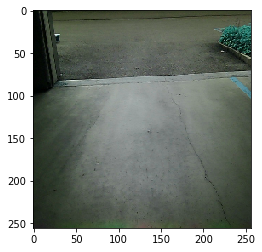

False (0.24952375888824463, 0.9300966513784308)


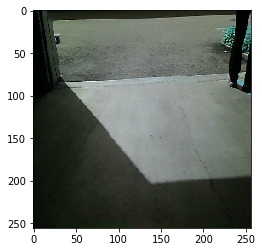

True (0.9387561480204264, 0.4346828711660285)
True (0.9825445281134711, 0.1704812489057842)
True (0.9911269346872965, 0.044837904603857746)
True (0.9916355080074735, 0.047553071850224546)
True (0.9937477906545004, 0.04514685743733456)
True (0.992636521657308, 0.06115762183540746)
True (0.9829792181650797, 0.09655034855792397)
False (0.001263048525692688, 0.999796842273913)


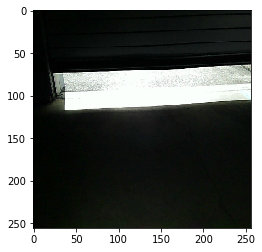

False (0.003117173289259275, 0.9999620287041915)


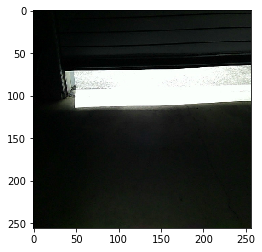

False (0.04865669127967623, 0.996283305318732)


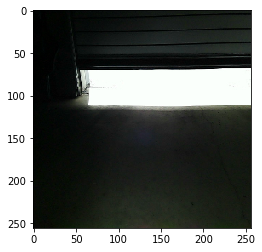

False (0.07885149286852942, 0.9911792654740182)


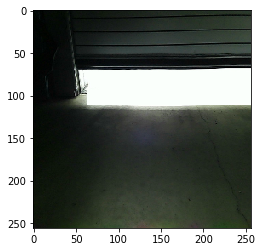

False (0.05188361803690592, 0.9952844569557592)


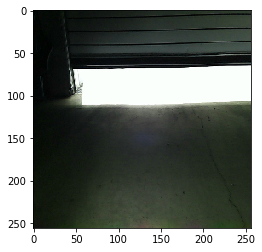

False (0.053220520416895546, 0.9953452662417763)


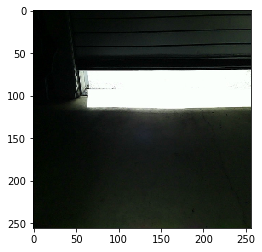

False (0.004169847971449296, 0.9991852860701712)


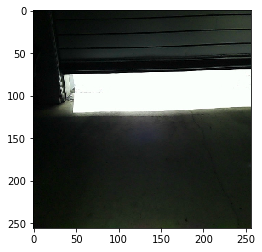

False (0.002772973332968023, 0.9993850055493807)


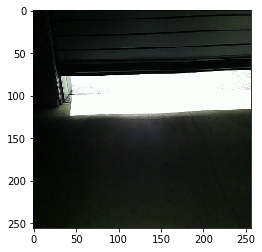

False (0.3809567954805162, 0.073857959948088)


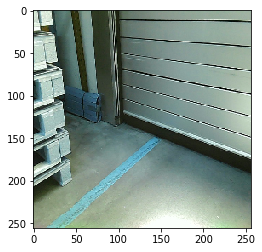

True (0.13922248946295845, 0.29728600853367854)
False (0.8056462340884738, 0.03966766831121946)


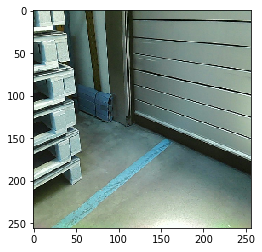

False (0.5084305206934611, 0.08519814830077321)


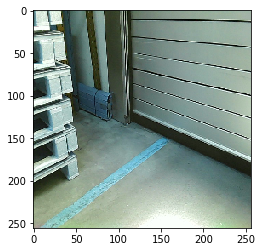

True (0.07985852162043254, 0.09760701342632896)
False (0.3411955171161228, 0.07614806137586895)


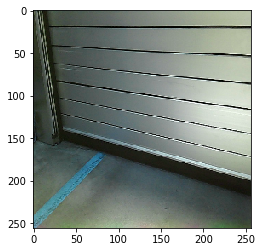

True (0.12581591308116913, 0.18316521142658435)
False (0.3807094626956516, 0.05077113603290759)


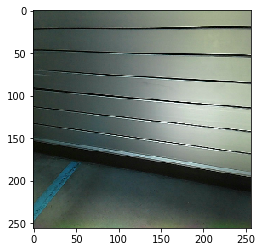

True (0.9991572697957357, 0.0015319052985624264)
True (0.9988435374365913, 0.003354454216988463)
True (0.9981443352169461, 0.002864852155509748)
True (0.9956095483567979, 0.013049718188612084)
True (0.9936413764953613, 0.012711722403764725)
True (0.9915870560540093, 0.014728100676285593)
False (0.9711844391292996, 0.005169562995433807)


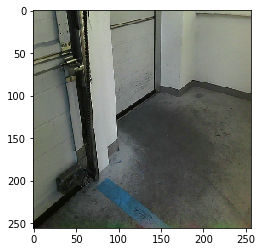

False (0.6995446549521552, 0.14529202486339368)


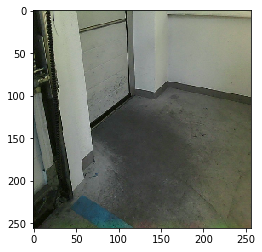

False (0.8869579633076986, 0.03443293822439093)


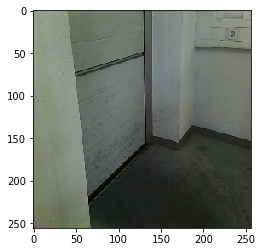

False (0.9461190700531006, 0.01324168827972914)


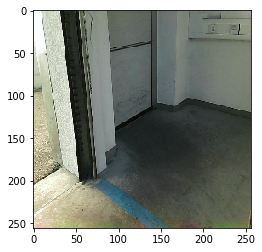

False (0.842867374420166, 0.03653207186021303)


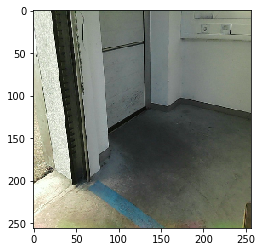

False (0.7683909204271104, 0.08784032809106927)


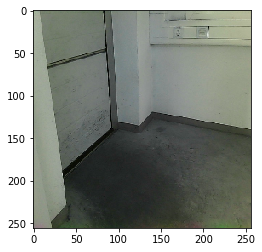

False (0.542908787727356, 0.14107595619402433)


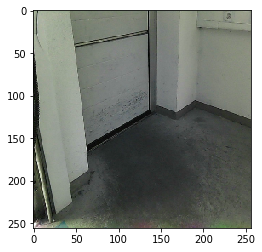

False (0.46433748139275444, 0.28697711543033)


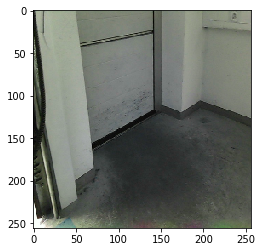

False (0.6374484830432467, 0.17469212569688497)


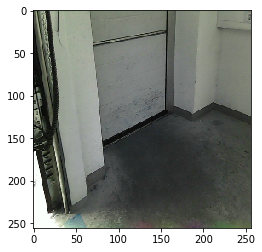

False (0.4799703492058648, 0.1503888117639642)


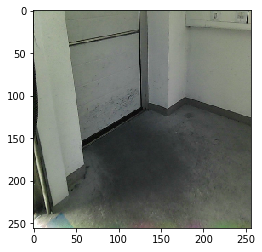

False (0.7272535959879557, 0.15185585147456118)


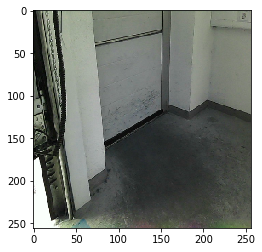

False (0.5811434586842855, 0.26427698135375977)


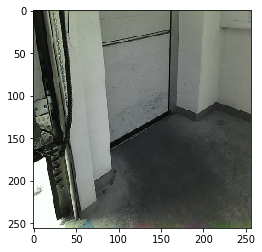

False (0.6517263783348931, 0.19320338023336311)


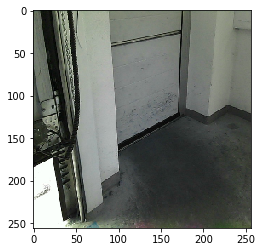

False (0.36161257161034477, 0.2975927654065584)


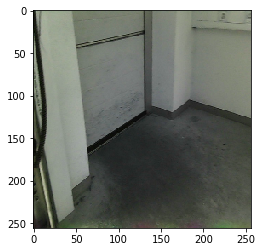

False (0.7490437030792236, 0.08317601523901287)


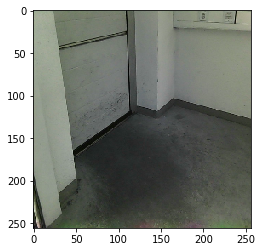

False (0.7561857435438368, 0.07005928221501802)


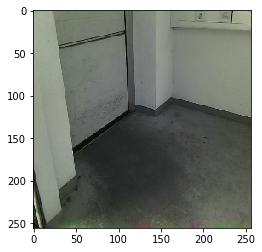

False (0.5547392103407118, 0.23003191069552772)


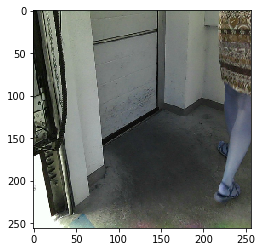

False (0.7509498066372342, 0.12007634576998259)


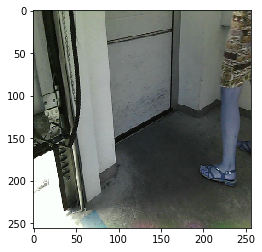

True (0.038909743229548134, 0.5475588472265946)
True (0.036009924279318914, 0.6454731037742213)
True (0.03213918126291699, 0.579362806520964)
True (0.021382262309392292, 0.6315469992788214)
True (0.08230944640106624, 0.5488418026974327)
True (0.041435330278343625, 0.6550279667502955)
True (0.07994509239991505, 0.5679185641439337)
True (0.07664457460244496, 0.6090810926336991)
True (0.053491262098153435, 0.600980984537225)
False (0.4041617711385091, 0.1629133287229036)


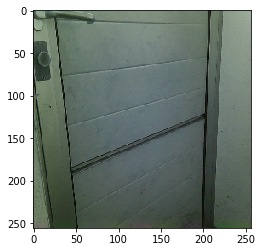

True (0.20110776027043661, 0.3434376967580695)
True (0.1382533444298638, 0.3446461526971114)
True (0.0741030904981825, 0.4825975769444516)
True (0.013066389701432653, 0.7119614199588173)
True (0.009103250896765126, 0.7216992378234863)
True (0.02650430839922693, 0.6487196621141935)
True (0.043862381743060216, 0.5385841695885909)
True (0.07290593120786878, 0.563905025783338)
True (0.04563987006743749, 0.6473839408472964)
True (0.075069107943111, 0.49911460123564066)
True (0.04655143784152137, 0.5669320759020353)
True (0.03850950631830427, 0.6184063585180986)
True (0.07220469249619378, 0.47996188464917633)
True (0.030130396286646526, 0.6296425744106895)
True (0.08297081953949398, 0.5021654053738243)
True (0.08205704887708028, 0.5127602501919395)
True (0.14810347225930956, 0.37821903981660543)
True (0.16006548206011453, 0.3356265206086008)
True (0.11226114961836073, 0.4339265321430407)
True (0.0012438190557683508, 0.9270555596602591)
True (0.001117199400646819, 0.8664395683690121)
True (0.

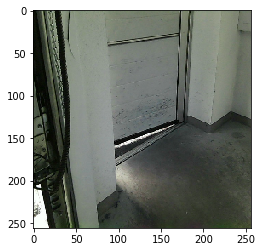

False (0.3297615382406447, 0.4667860081321315)


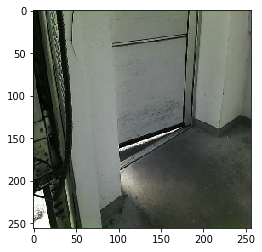

False (0.3621873590681288, 0.399784150876497)


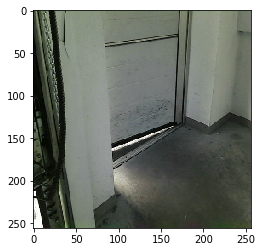

True (0.44224023818969727, 0.31387939578608465)
False (0.028758089575502608, 0.6235506660059879)


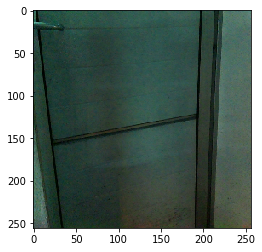

True (0.8223035335540771, 0.12090575067620528)
True (0.9671805169847276, 0.012437494961838973)
True (6.837089474882103e-05, 0.9997576412401701)
True (0.00013827075599692762, 0.9995176917628238)
True (1.3167357893608925e-05, 0.9999442853425679)
True (5.040956360365575e-05, 0.9998566476922286)
False (0.9996823999616835, 0.0003743928085130296)


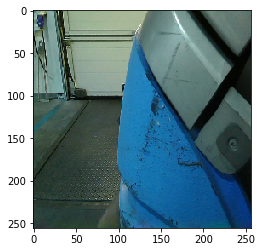

True (3.0348303779545757e-05, 0.999827786495811)
True (2.4906552425818518e-05, 0.999932188736765)
True (1.531685039582145e-05, 0.9998733118960732)
True (1.1384491800628086e-05, 0.999994579114412)
True (1.7273626023476634e-05, 0.9999917180914628)
True (2.9230134613398048e-05, 0.999971163900275)
True (3.793318481055192e-05, 0.9999646136635228)
True (2.8315626776828947e-05, 0.9999758569817794)
True (9.811493226960818e-06, 0.9999930984095523)
True (1.7708480097806183e-05, 0.999983360892848)
True (2.5661632308684704e-05, 0.9999448876631888)
True (6.025263994363033e-05, 0.9999713646738153)
True (1.195013747848053e-05, 0.9999656426279169)
True (1.7149502632997206e-05, 0.9999122117695055)
True (2.9637414829469184e-05, 0.9999599456787109)
True (1.852859471303721e-05, 0.9999325902838456)
True (4.693601820488564e-05, 0.9999849670811704)
True (2.173310996214342e-05, 0.9999862219157972)
True (1.7052258246824043e-05, 0.9999938011169434)
True (0.00040943498283417686, 0.9999950057581851)
True (8.27624

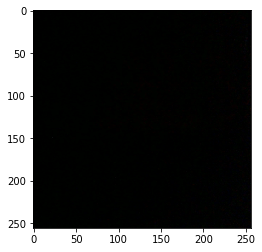

True (0.0004635000756631295, 0.809355986745734)
True (9.794551685142021e-05, 0.8449637764378598)
True (0.012668355057636896, 0.666675329208374)
True (0.024506141742070515, 0.5387910918185586)
True (0.021930580337842304, 0.5552495027843275)
True (0.01764125583900346, 0.5836129439504523)
True (0.9999439451429579, 0.00014823403724126125)
True (0.9996660550435384, 0.0007732385573418517)
True (0.9993970129224989, 0.0008664861885144523)
True (0.999892446729872, 0.0006120501600794102)
True (0.9999192025926378, 0.00016823515761643648)
True (0.9998875459035238, 0.00021299873601253095)
True (0.9999175601535373, 0.0001985730762642465)
True (0.9999414020114474, 8.88522695995083e-05)
True (0.9999495347340902, 8.275020579611392e-05)
True (0.9999131626553006, 6.650013260935482e-05)
True (0.9999235471089681, 0.00010512788829050566)
True (0.9999440246158176, 0.00010735458865957825)
True (0.9999176661173502, 0.00013754918779197492)
True (0.9999545415242513, 9.051222188741361e-05)
True (0.999949561225043

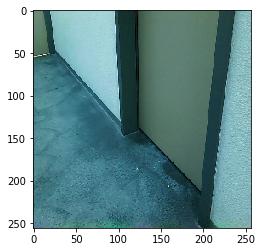

True (0.9996253119574653, 0.0012952823093847225)
True (0.9946231577131484, 0.022135495355254727)
True (0.9980040126376681, 0.007169713315210845)
True (0.9983883963690864, 0.002290799821677961)
True (0.9902848402659098, 0.04365756794026023)
True (0.9969375398423936, 0.0158033114122717)
False (0.36470842361450195, 0.46046541866503266)


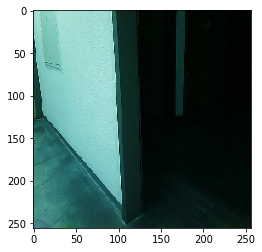

True (0.7238161563873291, 0.2541299368205823)
True (0.8028075695037842, 0.12280298534192537)
True (0.7932109832763672, 0.08284021208160802)
False (0.03498903330829409, 0.7336722173188862)


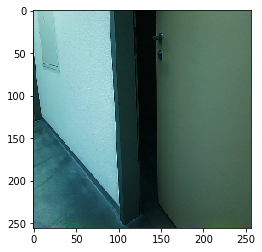

True (0.010310416006379657, 0.9992605259543971)
True (0.000670270114723179, 0.9999204183879652)
True (5.936421479822861e-05, 0.9999957837556538)
True (0.00020742416058460044, 0.999981729607833)
True (0.0037098942945400872, 0.9997512415835732)
True (0.00010080688904660444, 0.9999853937249434)
True (0.007347875378198094, 0.9957817730150724)
True (0.47975881894429523, 0.8904859141299599)
True (7.174781543047477e-05, 0.9999926968624717)
True (2.6542090280498895e-05, 0.9999336192482396)
True (4.7449183411016646e-05, 0.999902649929649)
True (3.058765327700207e-05, 0.999949103907535)
True (1.870736216207863e-05, 0.9998089890731009)
True (1.0395230977640798e-05, 0.999609721334357)
True (7.504918054716351e-06, 0.9999724187349018)
True (8.301242107538403e-06, 0.9998775281404194)
True (1.6117141664532635e-05, 0.999881342837685)
True (3.865952263974274e-05, 0.9996962296335321)
True (3.439641942451191e-05, 0.9999110322249564)
True (2.2886977805885384e-05, 0.9999101036473325)
True (8.740579384417893

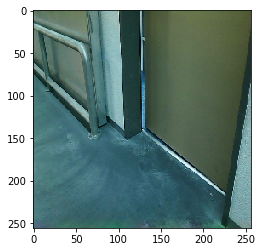

True (0.9998825656043159, 0.0009952420123705739)
True (0.9999142487843832, 0.0008864927252656535)
True (0.9997337924109565, 0.001750557095204529)
False (0.014933877521091037, 0.9993361924823961)


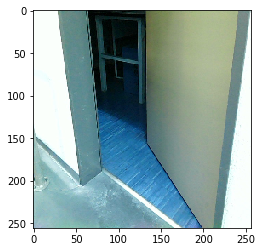

False (0.015565950216518508, 0.998970157221744)


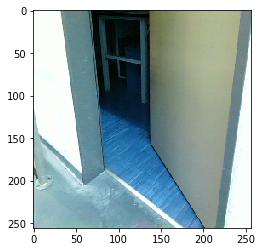

False (0.044570282101631165, 0.9945312550193385)


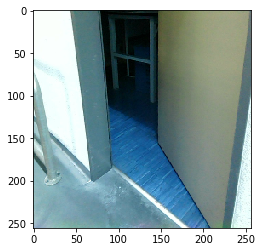

False (0.44332310888502335, 0.8135484645241186)


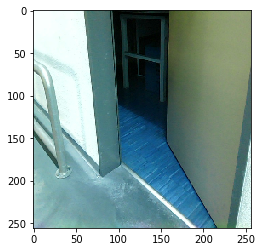

True (0.8245362440745035, 0.38392192439029094)
True (0.9775242275661893, 0.02196084551121059)
True (0.9953814347585043, 0.0018010665417501801)
False (0.13083624011940426, 0.9022878847624126)


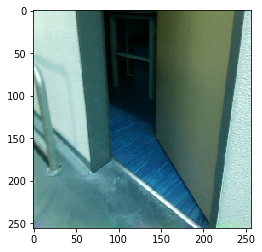

False (0.0001455618443691896, 0.9997863518564325)


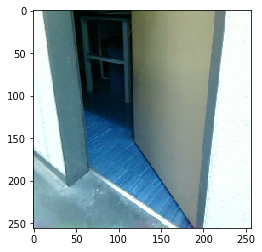

False (2.4127743219853277e-05, 0.9999777141370272)


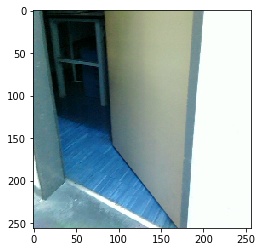

False (1.8140327382651674e-05, 0.9999506849991647)


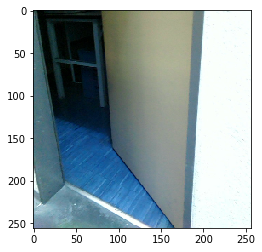

False (0.00035053973422489234, 0.9999407467089201)


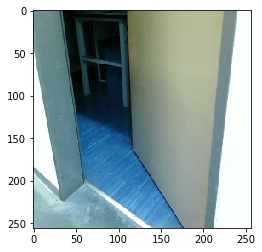

False (0.00017213615420688357, 0.9999967625266627)


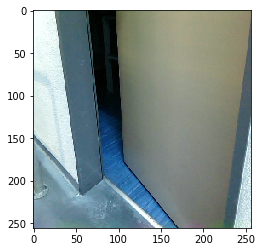

False (0.00010652939090505242, 0.9999920945418509)


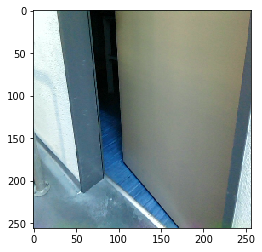

False (9.47135914531019e-05, 0.9999602217423288)


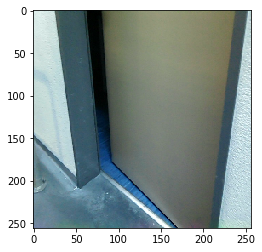

False (3.6752119841468004e-05, 0.9999862470124897)


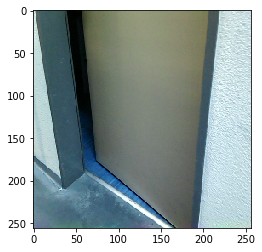

False (6.309414069013049e-05, 0.9999937007301732)


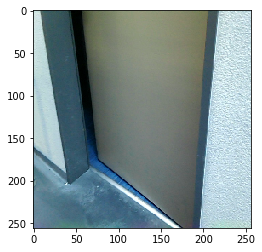

False (4.728153726318851e-05, 0.9999831099259225)


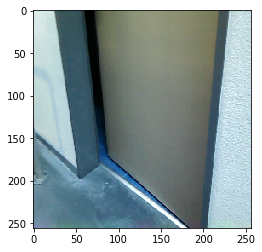

False (1.111347309132624e-05, 0.9999527680246454)


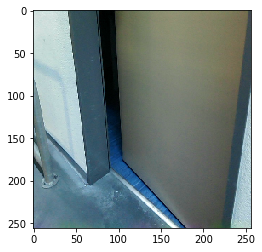

False (3.190150891896337e-05, 0.9997454693442897)


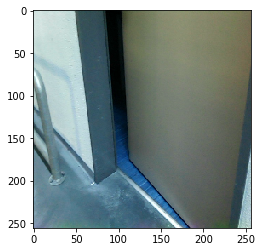

False (0.0013520706755419571, 0.9917288328471937)


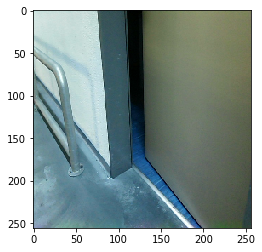

True (0.9024501376681857, 0.13584190607070923)
False (0.14043010771274567, 0.7311631252891139)


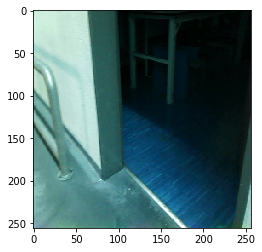

True (0.6940768824683295, 0.5626499778346011)
True (0.7521209319432577, 0.6370491479572497)
False (0.4844634532928467, 0.4992654323577881)


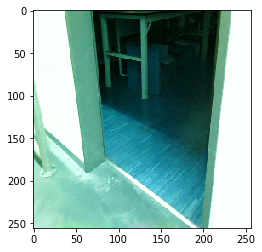

True (0.7140195634629991, 0.37620570785120916)
True (0.9162391026814779, 0.16468766488526998)
True (0.9922071297963461, 0.008050244693693361)
True (0.9676940706041124, 0.020289435590568342)
True (0.999988423453437, 3.496444811676874e-05)
True (0.9825598398844401, 0.015839215564100367)
False (0.0009046140282104412, 0.9993501964368319)


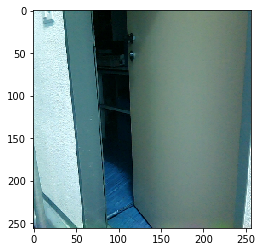

True (0.02819809317588806, 0.9873559349461606)
True (0.019433199531502195, 0.9928532650596217)
True (0.016003983716169994, 0.9957091431868704)
True (0.125730832417806, 0.9839872310036107)
True (0.0067542749974462725, 0.9899398402163857)
True (0.0026330039319064883, 0.9984488738210577)
True (0.023646740449799433, 0.988634887494539)
True (0.009881022489733167, 0.9856588464034232)
True (0.006132658364044296, 0.9713263009723864)
True (0.11755376391940647, 0.9284385379992033)
True (0.0019040803631974591, 0.996479963001452)
True (0.024953369465139177, 0.9809320851376182)
True (0.0011073785264872843, 0.9974149653786107)
True (0.0072522689070966505, 0.9895281038786236)
True (0.004512805905607011, 0.9978404547038832)
True (0.04806904660330878, 0.962533248098273)
True (0.02138660310043229, 0.9838529386018452)
True (0.020074151042434905, 0.9882587382667943)
True (0.006808119515577952, 0.9869667103416041)
True (0.00719852600660589, 0.9940659121463173)
True (0.002788602891895506, 0.9838786125183105

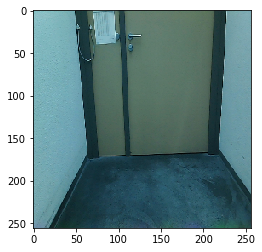

True (0.283982064988878, 0.4703245664897718)
False (0.45930182933807373, 0.26317257630197627)


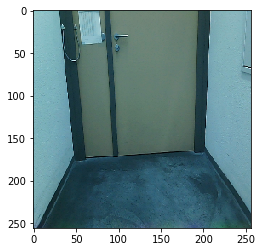

False (0.5325567589865791, 0.21087403673874705)


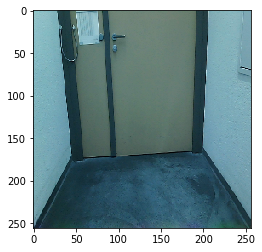

True (0.3386122915479872, 0.434049505936472)
False (0.6940354506174723, 0.0716407879402763)


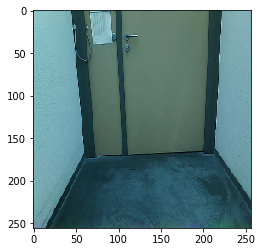

False (0.7449550893571641, 0.05555368724622225)


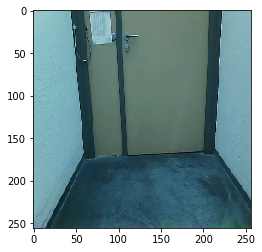

False (0.8762679364946153, 0.02226757493458296)


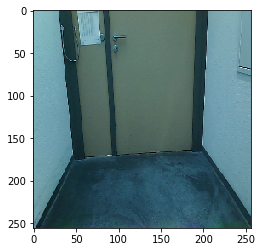

False (0.6804538038041856, 0.07068923115730286)


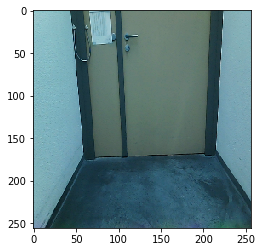

False (0.5917375087738037, 0.1858158268426594)


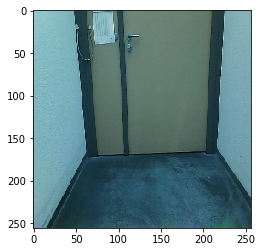

False (0.4842507309383816, 0.23783988701669792)


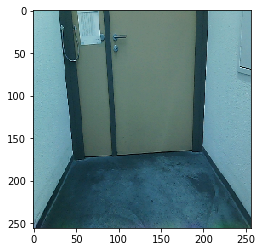

True (0.15761327743530273, 0.5922326916142514)
False (0.3685866991678874, 0.3122164575677169)


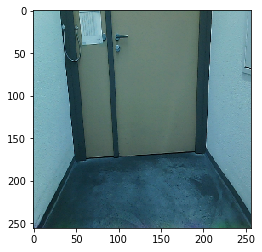

False (0.4194447464413113, 0.3052646549124467)


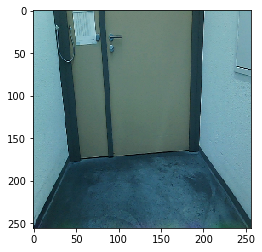

False (0.7018643750084771, 0.07977488166407536)


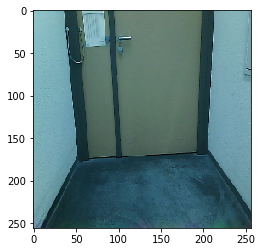

False (0.5799514982435439, 0.13543036736940084)


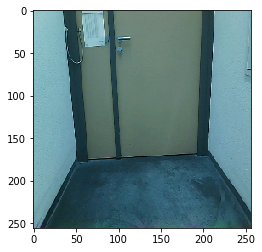

False (0.8091745641496446, 0.03947627858111733)


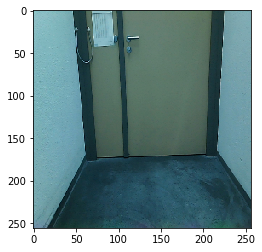

True (0.20001580980088976, 0.4882788030724776)
False (0.4236178927951389, 0.2939712875767758)


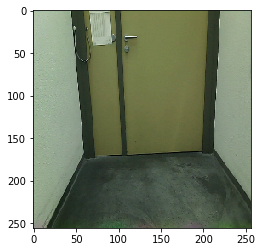

True (0.34217811955346, 0.3743819563012374)
True (0.14442006084654066, 0.5610072487278989)
True (0.06521976325247023, 0.7620035221702174)
True (0.06483018729421827, 0.7481699993735865)
False (0.4035091929965549, 0.3258801259492573)


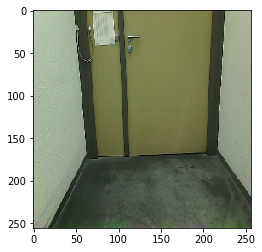

False (0.4442205958896213, 0.32271168733897965)


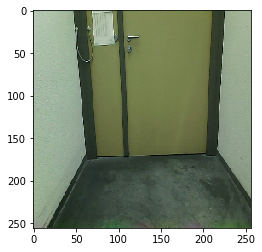

False (0.46795744366115993, 0.21559422894528038)


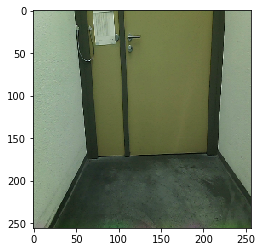

False (0.6245521439446343, 0.06835990830471642)


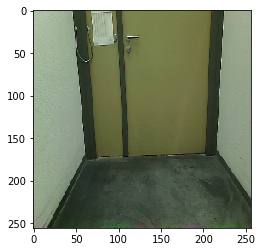

False (0.7836193508572049, 0.027298482625108016)


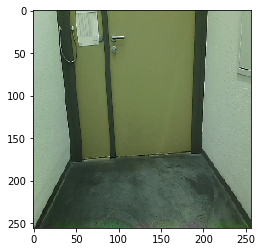

False (0.6472838719685873, 0.10258845279091283)


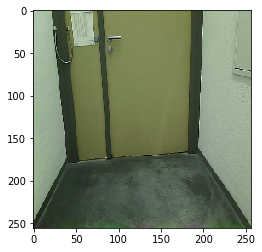

False (0.6551795800526937, 0.07682991812103673)


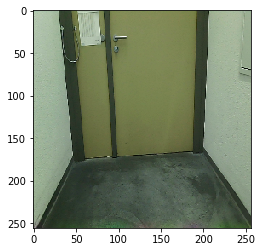

True (0.2582747671339247, 0.47701967389960037)
False (0.4839680989583333, 0.14416731345026115)


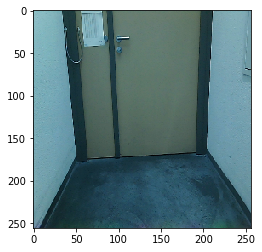

True (0.3060295581817627, 0.3888339870854428)
False (0.4821854564878676, 0.2027139287245901)


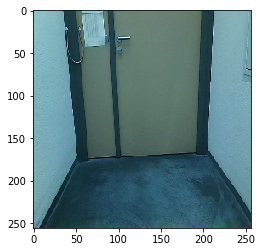

True (0.08019331097602844, 0.7137241112558466)
False (0.4412103361553616, 0.2694984611712004)


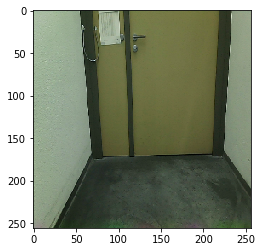

True (0.19997186793221366, 0.44775547479328354)
False (0.4376775821050008, 0.25711574679926824)


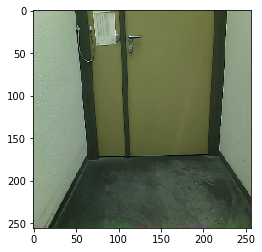

True (0.9999125003814697, 0.00016043226136580894)
True (0.9984819094340006, 0.0007236600412349952)
True (0.9407435788048638, 0.031697019934654236)
True (0.99993806415134, 0.00013367453357204795)
True (0.9693191581302218, 0.02772864464082216)
True (0.9708574348025851, 0.03718367062116924)
True (0.9677977561950684, 0.037351333781292566)
True (0.9620721075269911, 0.061368347782837715)
True (0.9623506334092882, 0.049624617162503694)
True (0.9846213393741183, 0.012729765553223459)
True (0.906240807639228, 0.1550265111421284)
True (0.9250073432922363, 0.13613542130118922)
True (0.932373046875, 0.1930045297271327)
True (0.7496271663241916, 0.2532308478104441)
False (0.08230054047372606, 0.9300517032020971)


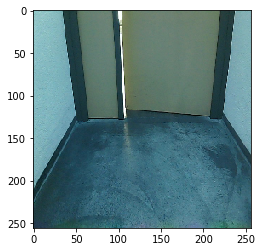

False (0.0302654720014996, 0.9765459863763106)


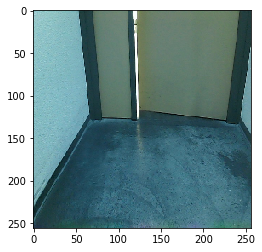

False (0.20014162196053398, 0.8995047117534437)


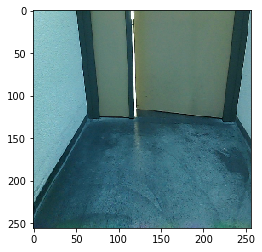

True (0.9994995329115126, 0.0003037400004502974)
True (0.9984431266784668, 0.0011928132980277663)
True (0.9991870986090766, 0.0008809584143914675)
True (0.9992846382988824, 0.0005231001659443504)
True (0.9998623265160455, 7.182205904667314e-05)
True (0.9998133712344699, 0.00014703206129764256)
True (0.9990201791127523, 0.0005025890361713735)
True (0.995833158493042, 0.0019504121063571227)
True (0.9994992150200738, 0.0002770540304481983)
True (0.9996383984883627, 0.0003229694220384485)
True (0.9994181791941324, 0.0004179425549840457)
True (0.9916930993398031, 0.00387626082489365)
True (0.9958731333414713, 0.0014417320489883423)
True (0.03361541488104396, 0.9741243061266447)
True (0.03833733581834369, 0.9662271047893324)
True (0.021517071045107312, 0.9805799534446314)
True (0.0339050872458352, 0.9791651023061652)
True (0.018493884139590792, 0.9832330251994886)
True (0.027559414092037413, 0.9788186926590768)
True (0.028874569882949192, 0.977453909422222)
True (0.02543496961394946, 0.98447

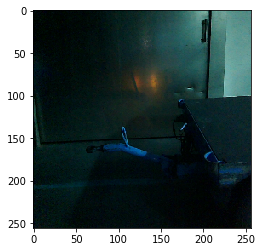

False (0.6541040473514133, 0.16762762320669075)


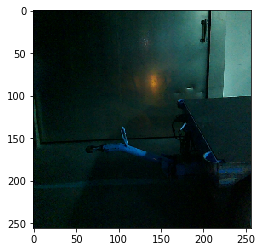

False (0.749810881084866, 0.10397779000432868)


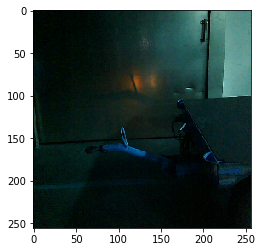

False (0.6935811572604709, 0.15185644438392237)


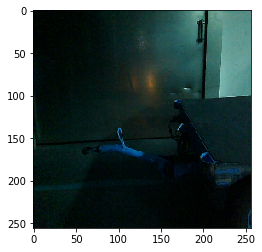

False (0.7471286985609267, 0.14558635887346769)


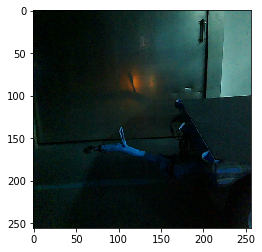

False (0.6109997828801473, 0.21790831967404015)


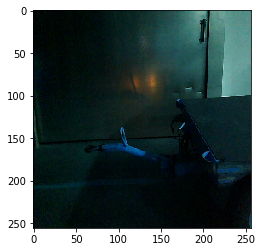

False (0.6076980829238892, 0.23931225977445902)


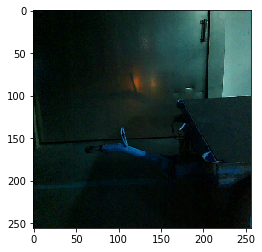

False (0.6278517246246338, 0.193762132996007)


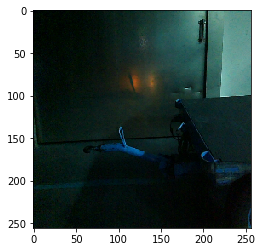

False (0.7121735148959689, 0.11551637712277864)


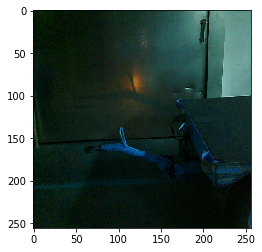

False (0.8345822758144803, 0.0694486279236643)


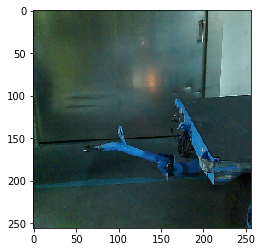

False (0.8942441675398085, 0.04064644167297765)


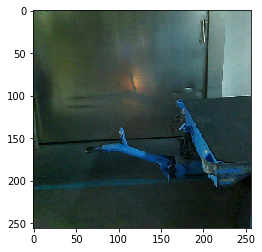

False (0.8001220756106906, 0.12357852960887708)


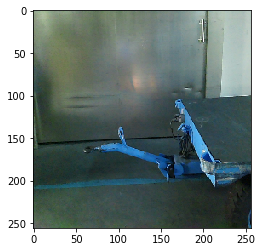

False (0.8850331041547987, 0.045668910992772954)


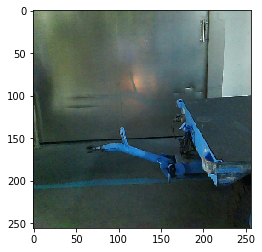

False (0.6643848286734687, 0.17798617011622378)


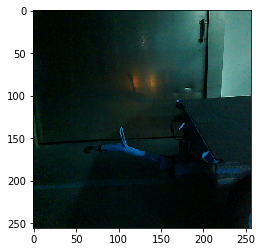

False (0.7016838126712375, 0.18584879448539332)


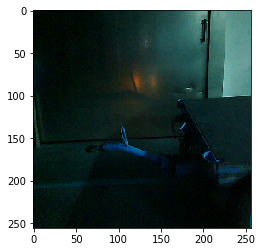

False (0.48575141694810653, 0.3119420566056904)


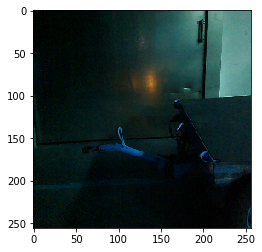

False (0.7707827621036105, 0.10894893345079924)


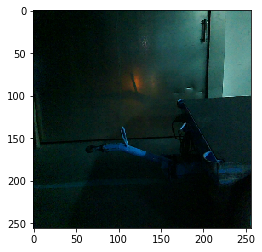

False (0.7641106711493598, 0.10017254164344386)


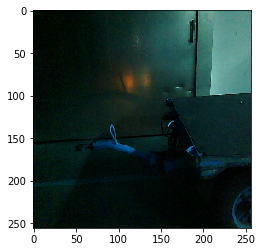

False (0.4908711910247803, 0.41271410490337174)


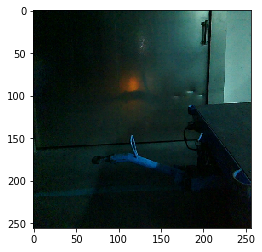

False (0.6242997513877021, 0.31652442405098363)


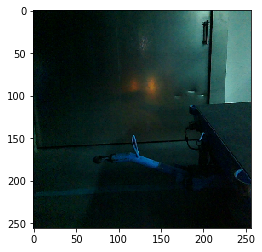

False (0.6319439013799032, 0.3129653428730212)


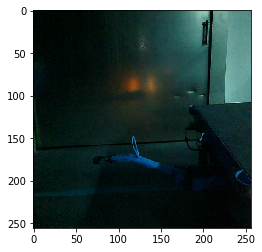

False (0.6307318210601807, 0.3312612207312333)


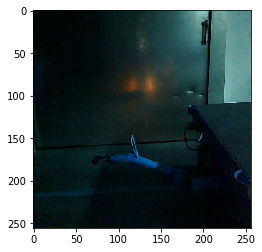

False (0.5538217888938056, 0.210501608095671)


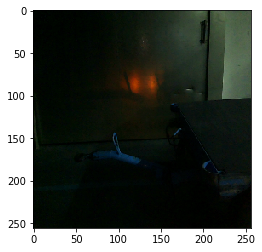

False (0.602799031469557, 0.2432189991599635)


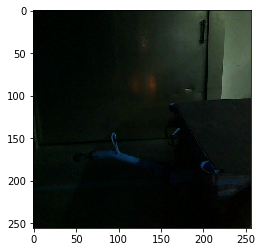

False (0.6529555055830214, 0.1720736026763916)


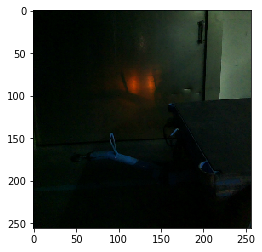

False (0.5747630066341824, 0.2212658493142379)


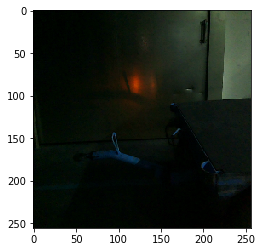

False (0.5191016991933187, 0.2657344341278076)


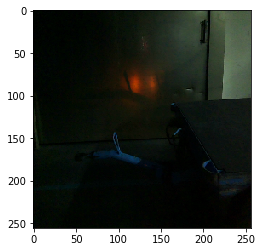

False (0.5952362749311659, 0.22729475247232536)


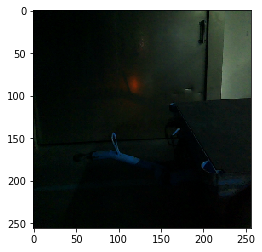

False (0.5353932910495334, 0.2600788568195544)


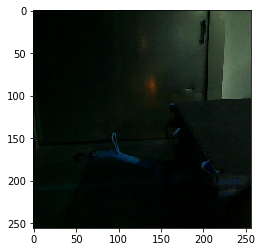

False (0.607152435514662, 0.20821774005889893)


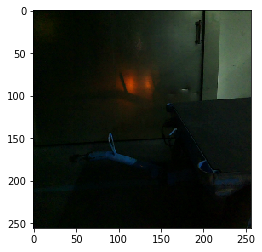

False (0.8005209234025743, 0.08805133167066072)


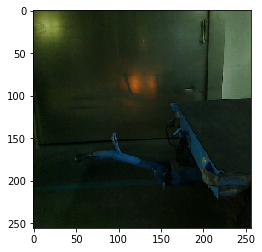

False (0.7016011079152426, 0.09987875348643253)


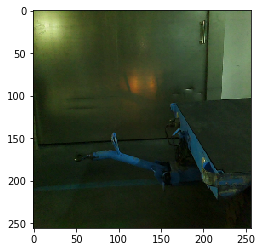

False (0.757928901248508, 0.06800659393009387)


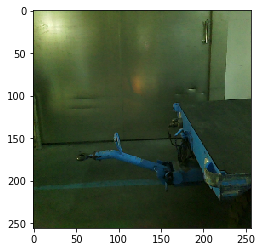

False (0.6465540197160509, 0.10972353659178082)


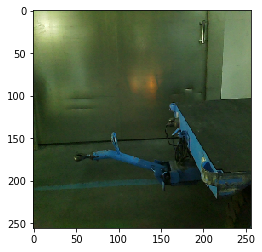

False (0.7401378684573703, 0.08934875224765979)


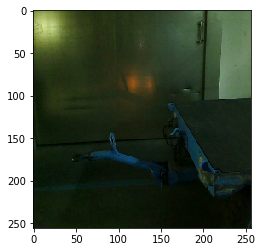

False (0.6820385720994737, 0.13022586546446147)


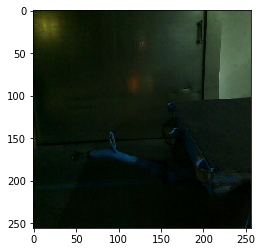

False (0.6551852888531156, 0.2419641708072863)


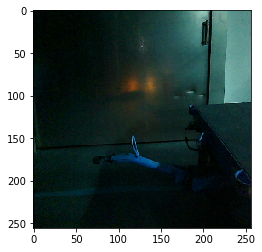

False (0.6282013919618394, 0.26150887890865926)


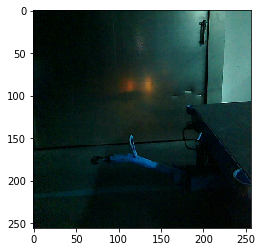

False (0.7019879817962646, 0.2181039107473273)


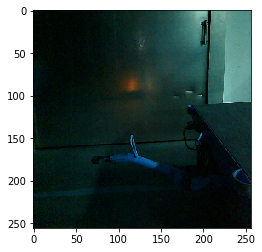

False (0.5133190287484063, 0.4325336406105443)


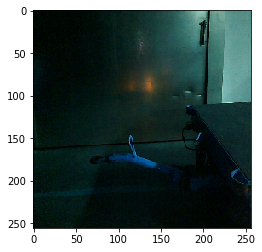

False (0.546794573465983, 0.2713680455559178)


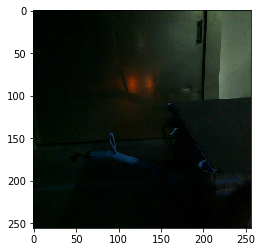

False (0.5654017925262451, 0.20711590114392733)


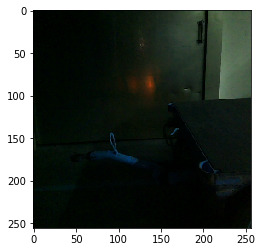

False (0.5962251159879897, 0.22743171767184608)


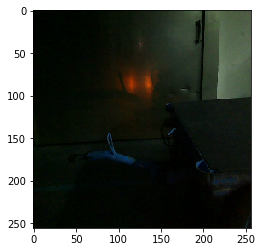

False (0.504073805279202, 0.2863376768011796)


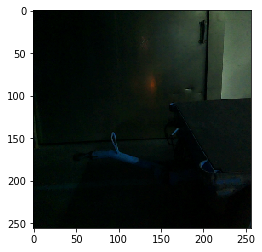

False (0.5391613642374674, 0.24662719902239347)


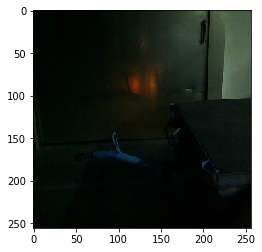

In [17]:
for s in scores:
    print s[0], s[1]
    if not(s[0]):
        plt.imshow(s[2])
        plt.show()